# UMAPs Neurips samples, NK cells

EG37, EG44, EG45, EG48, EG49, EG50, EG51, EG52, EG53, EG59, EG60, EG61, EG62, EG63 are AML cases.

In this notebook samples are merged together, after which NK cell cluster is defined and NK cells are selected for further analysis. All UMAPs are generated based on latent space coordinates. 

In [6]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib import cm
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap
import textwrap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



In [7]:
def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props


def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    
    return fig

In [8]:
adata_merged = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/AML_norm.h5ad')

In [9]:
adata_merged

AnnData object with n_obs × n_vars = 26365 × 7277
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_1'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-10', 'highly_variable-10', 'means-10', 'dispersions-10', '

In [19]:
#surface protein expression, DSB selected
prot=adata_merged.obsm['protein_expression_dsb']

In [20]:
#some proteins and genes have same names, here _prot added after protein names
prot=prot.rename(columns={'CD2': 'CD2_prot', 'CD38': 'CD38_prot', 'CD34': 'CD34_prot', 'CD44': 'CD44_prot'})

In [21]:
#adding protein information to obs

a = adata_merged.obs
b = prot

adata1=pd.concat([a, b], axis=1)
adata_merged.obs=adata1

In [22]:
adata_merged

AnnData object with n_obs × n_vars = 26365 × 7277
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_

In [23]:
#save the file!

adata_merged.write('/Users/tiinatuononen/Desktop/Thesis/Project/data/AML_norm.h5ad')

In [24]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_merged, use_rep="X_totalVI")    

sc.tl.umap(adata_merged)

In [25]:
adata_merged.X

<26365x7277 sparse matrix of type '<class 'numpy.float32'>'
	with 55184841 stored elements in Compressed Sparse Row format>

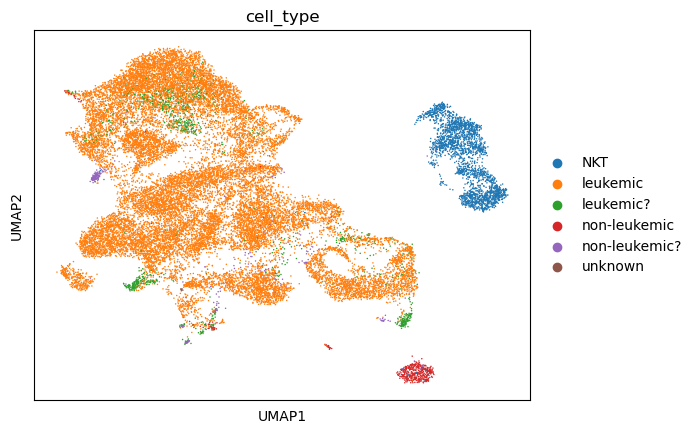

In [26]:
sc.pl.umap(adata_merged, color = ['cell_type'], color_map = 'viridis')

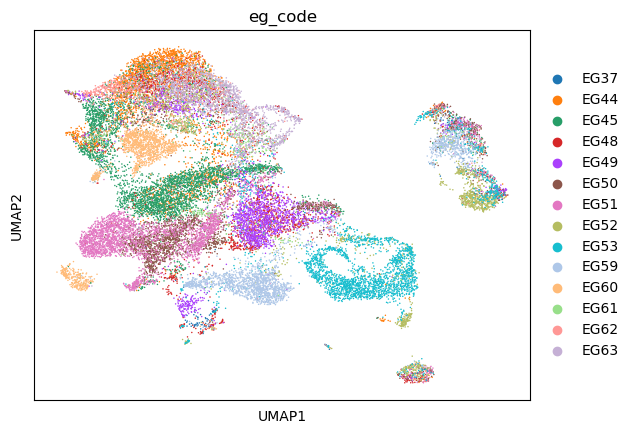

In [27]:
sc.pl.umap(adata_merged, color = ['eg_code'], color_map = 'viridis')

In [28]:
#To find gene names

#result = [i for i in adata_neurips.var_names if i.startswith('TC')]
#print(result)

In [29]:
sc.tl.leiden(adata_merged, resolution = 1, key_added = "leiden_1")

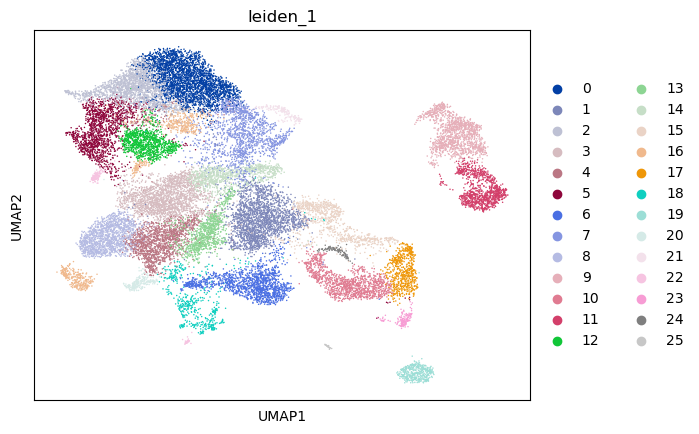

In [30]:
sc.pl.umap(adata_merged, color=['leiden_1'], ncols =3)

In [31]:
#Markers received from HRUH, KLRC1 = NKG2A

nk_genes = ["FGFBP2", "FCGR3A", "S1PR5", "KLRC1", "KLRC2", "KLRC3", "KLRD1", "GNLY","GZMB", "CX3CR1", "GPR56", "PRF1", "KLRB1", "SPON2", "NKG7", "TTC38", "FCRL6", "LILRB1","PLAC8", "MBP"]

nk_genes2 = ["NKG2A","NCAM1","GZMK","GZMA","KLRB1","KLRC2","GZMH","LAG3","B2M","HLA-DRA","OAS3","MX1","IRF7","MX2","IRF9","OAS1","OAS2", "EIF2AK2", "TNFRSF18", "TNFRSF9",  "TNFRSF4",  "CRTAM", "ENTPD1",  "HAVCR2",  "TIGIT", "TNFSF10", "BCL2L11", "CCL3", "CCL4", "TNF", "IFNG", "CD69"]

In [32]:
#Used to check which genes were measured

listOfmarkers= nk_genes
markers = []

for x in listOfmarkers:
    if x in adata_merged.var_names:
        print(x)
        markers.append(x)
        



GNLY
GPR56
NKG7
TTC38
PLAC8
MBP


In [33]:
#Used to check which genes were measured

listOfmarkers= nk_genes2
markers2 = []

for x in listOfmarkers:
    if x in adata_merged.var_names:
        print(x)
        markers2.append(x)




B2M
HLA-DRA
IRF7
EIF2AK2
BCL2L11
CCL4
CD69


In [34]:
nk_markers = [markers, markers2]

nk_markers = list(np.concatenate(nk_markers).flat)

nk_markers

['GNLY',
 'GPR56',
 'NKG7',
 'TTC38',
 'PLAC8',
 'MBP',
 'B2M',
 'HLA-DRA',
 'IRF7',
 'EIF2AK2',
 'BCL2L11',
 'CCL4',
 'CD69']

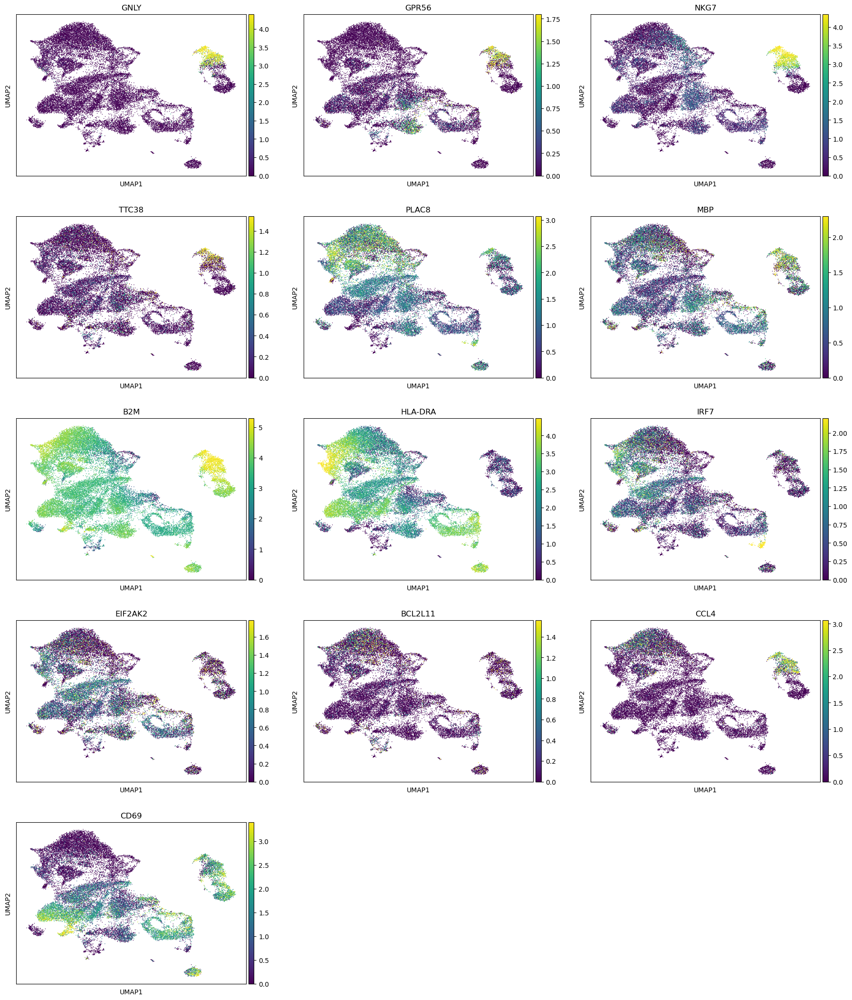

In [35]:
sc.pl.umap(adata_merged, color=nk_markers, ncols =3, vmax="p99")

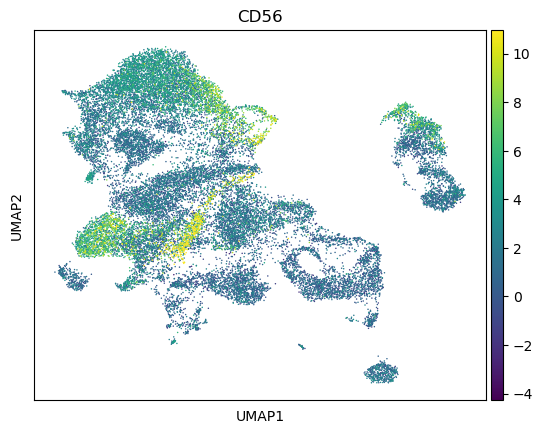

In [36]:
nk_prot = ['CD56']

sc.pl.umap(adata_merged, color=nk_prot, ncols =3, vmax="p99")

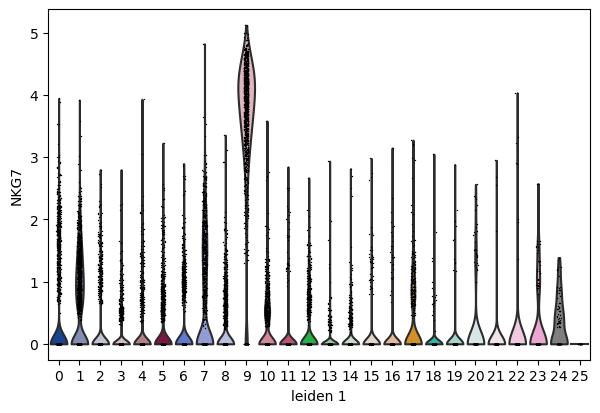

In [37]:
sc.pl.violin(adata_merged, ['NKG7'], groupby='leiden_1')

- Based on protein + RNA marker expression cluster 9 can be identified as NK cells. 


In [10]:
#selecting NK cell cluster
adata_nk = adata_merged[adata_merged.obs['leiden_1'] == "9"]

In [11]:
adata_nk

View of AnnData object with n_obs × n_vars = 1383 × 7277
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_1'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-10', 'highly_variable-10', 'means-10', 'dispersions

In [40]:
#calculating neigbors for object containing only NK cells, based on latent space

sc.pp.neighbors(adata_nk, use_rep="X_totalVI")

sc.tl.umap(adata_nk)

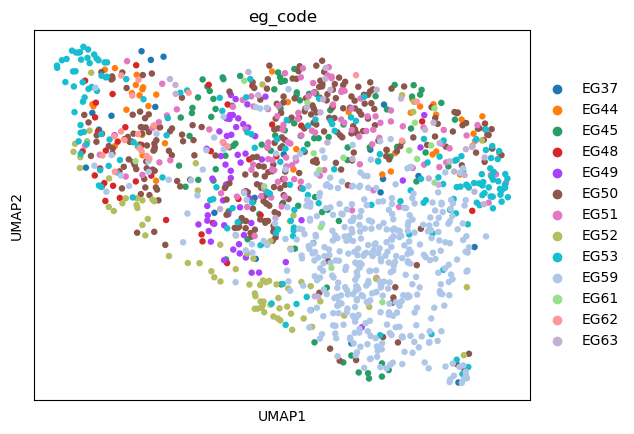

In [41]:
sc.pl.umap(adata_nk, color = ["eg_code"])

In [102]:
#Calculating leidens for latent object
sc.tl.leiden(adata_nk, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata_nk, resolution = 0.5, key_added = "leiden_0.5")
sc.tl.leiden(adata_nk, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata_nk, resolution = 0.7, key_added = "leiden_0.7")
sc.tl.leiden(adata_nk, resolution = 0.8, key_added = "leiden_0.8")


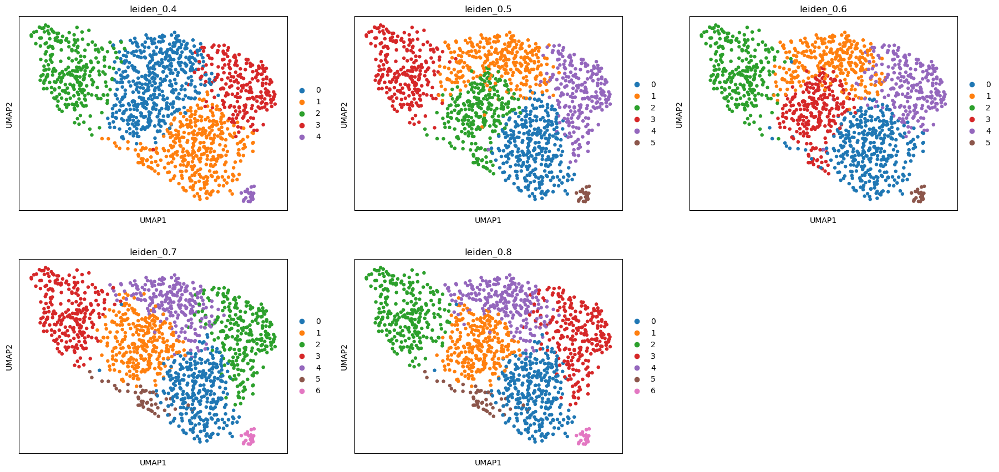

In [104]:
sc.pl.umap(adata_nk, color=['leiden_0.4','leiden_0.5','leiden_0.6', 'leiden_0.7', 'leiden_0.8'], ncols =3)

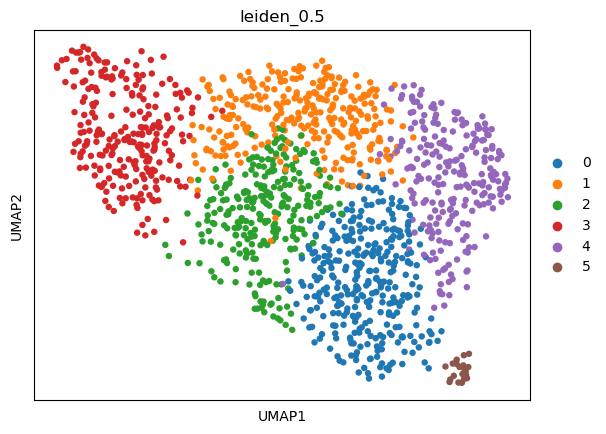

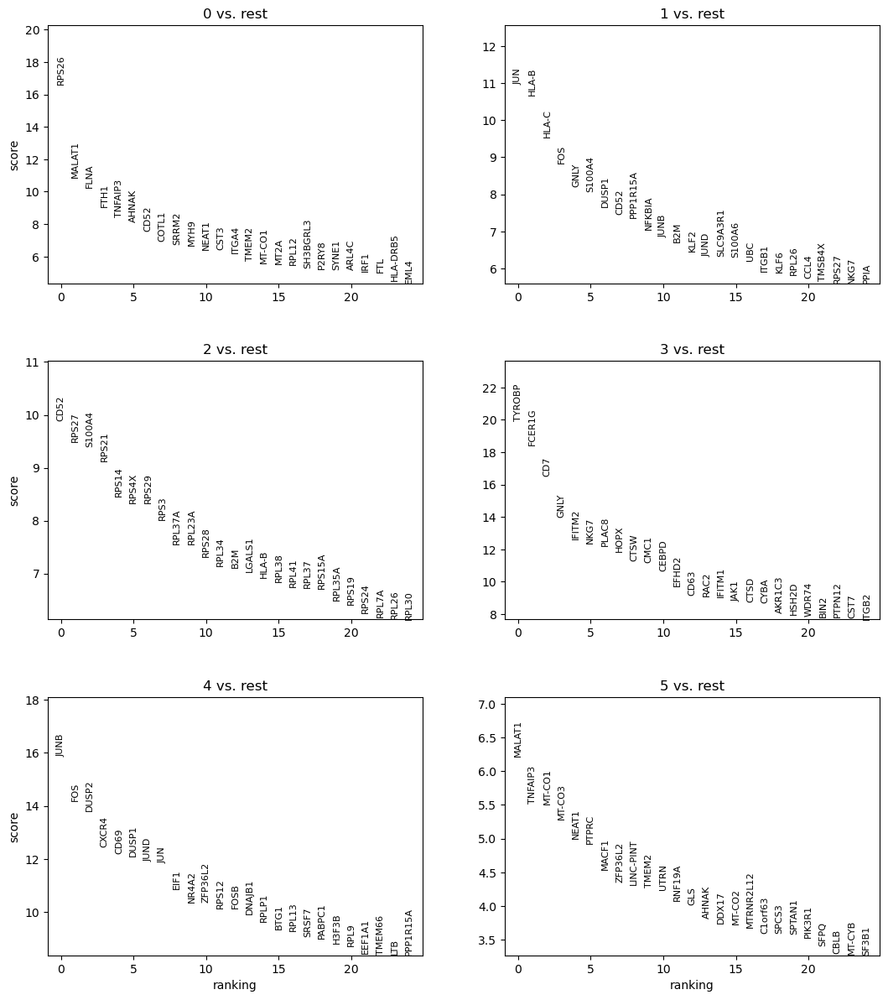

In [44]:
sc.pl.umap(adata_nk, color=['leiden_0.5'], ncols =3)

sc.tl.rank_genes_groups(adata_nk, 'leiden_0.5', method='wilcoxon')
sc.pl.rank_genes_groups(adata_nk, n_genes=25, sharey=False, ncols=2)

In [70]:
#Removing mitochondrial and ribosomal genes

#genes to be removed
mito_genes = adata_nk.var_names.str.startswith('MT-')
ribo_genes = adata_nk.var_names.str.startswith('RPL')
ribo_genes1 = adata_nk.var_names.str.startswith('RPS')

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, ribo_genes1)

#other genes kept
keep = np.invert(remove)

adata_nk = adata_nk[:,keep]

#print(adata_gex.n_obs, adata_gex.n_vars)

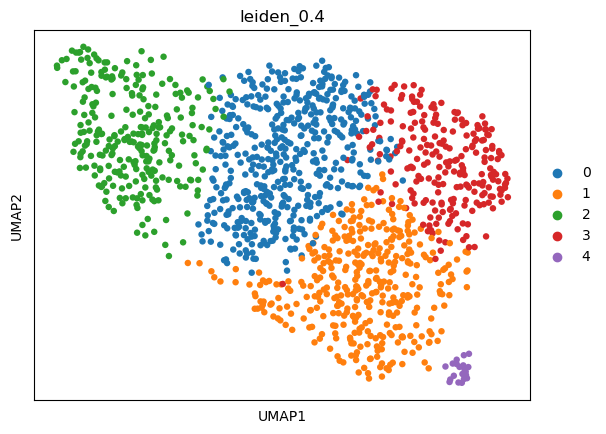

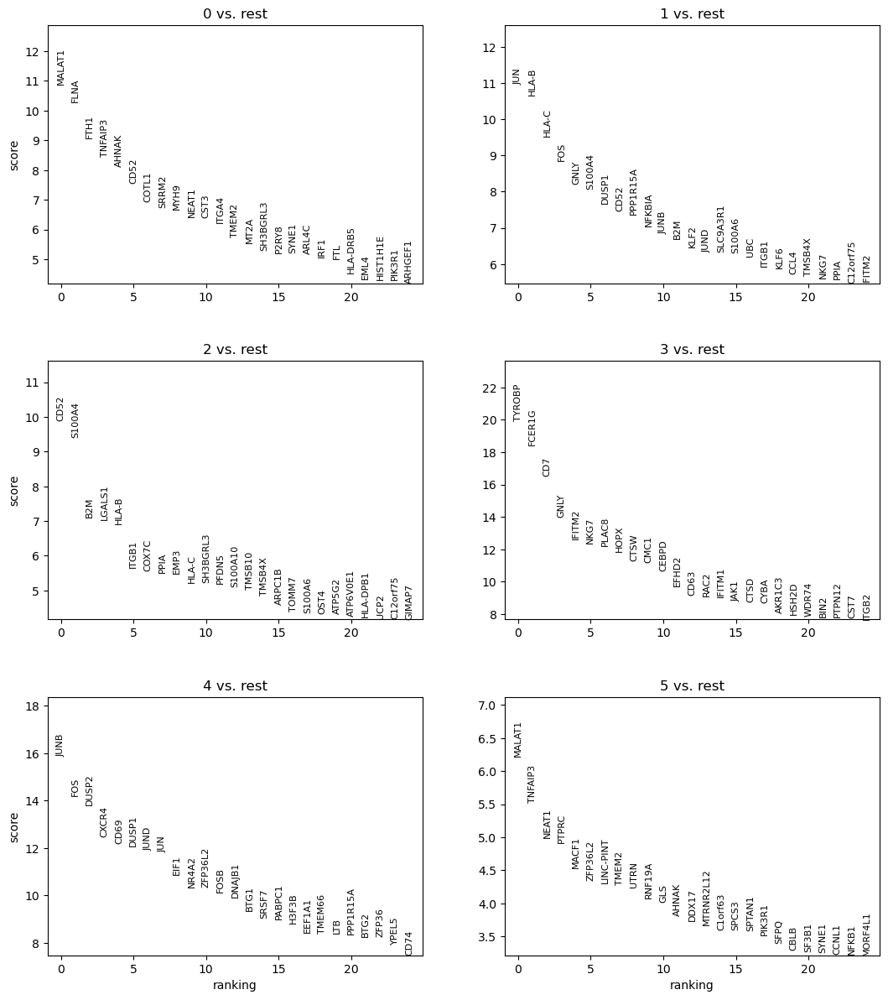

In [75]:
sc.pl.umap(adata_nk, color=['leiden_0.4'], ncols =3)

sc.tl.rank_genes_groups(adata_nk, 'leiden_0.5', method='wilcoxon')
sc.pl.rank_genes_groups(adata_nk, n_genes=25, sharey=False, ncols=2)

In [76]:
adata_nk

AnnData object with n_obs × n_vars = 1383 × 7175
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_1', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.4'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'

In [81]:
cluster_props

leiden_0.4,0,1,2,3,4
eg_code,,,,,
EG37,25.000000,10.000000,40.000000,20.000000,5.000000
EG44,17.500000,2.500000,47.500000,32.500000,0.000000
EG45,53.260870,13.043478,15.217391,18.478261,0.000000
EG48,35.714286,0.000000,59.523810,4.761905,0.000000
EG49,89.473684,3.508772,3.508772,3.508772,0.000000
EG50,56.457565,4.797048,26.199262,11.439114,1.107011
EG51,60.909091,3.636364,11.818182,23.636364,0.000000
EG52,11.250000,50.000000,30.000000,7.500000,1.250000
EG53,25.287356,6.321839,32.183908,34.482759,1.724138


In [79]:
cluster_props = get_cluster_proportions(adata_nk,
                            cluster_key="leiden_0.4",
                            sample_key="eg_code",
                            drop_values=None)


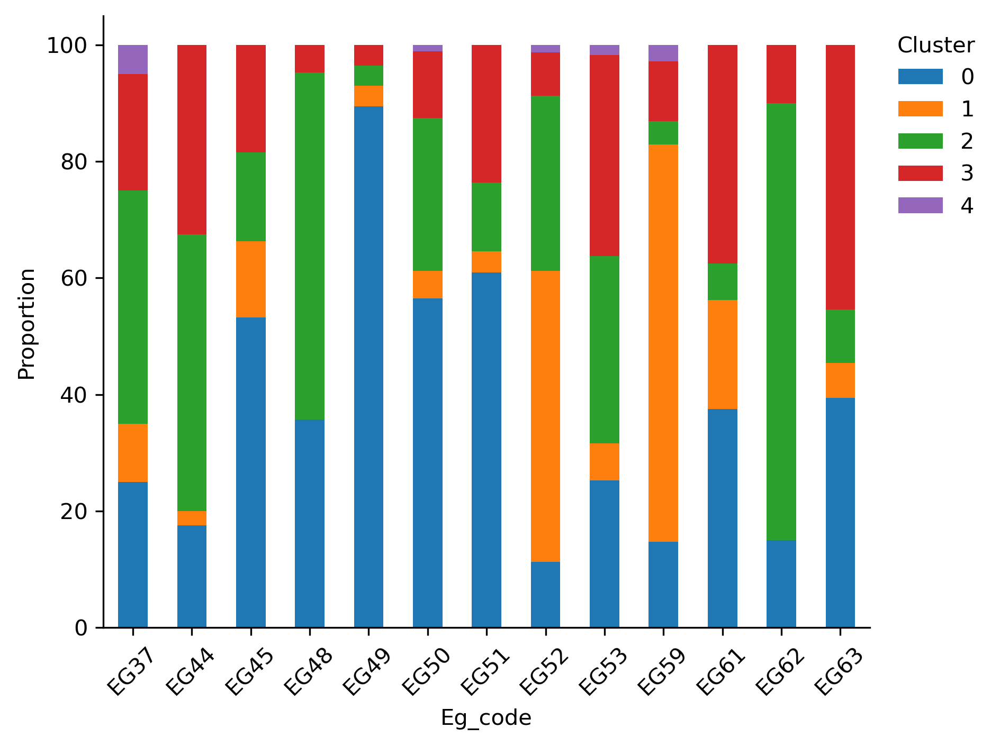

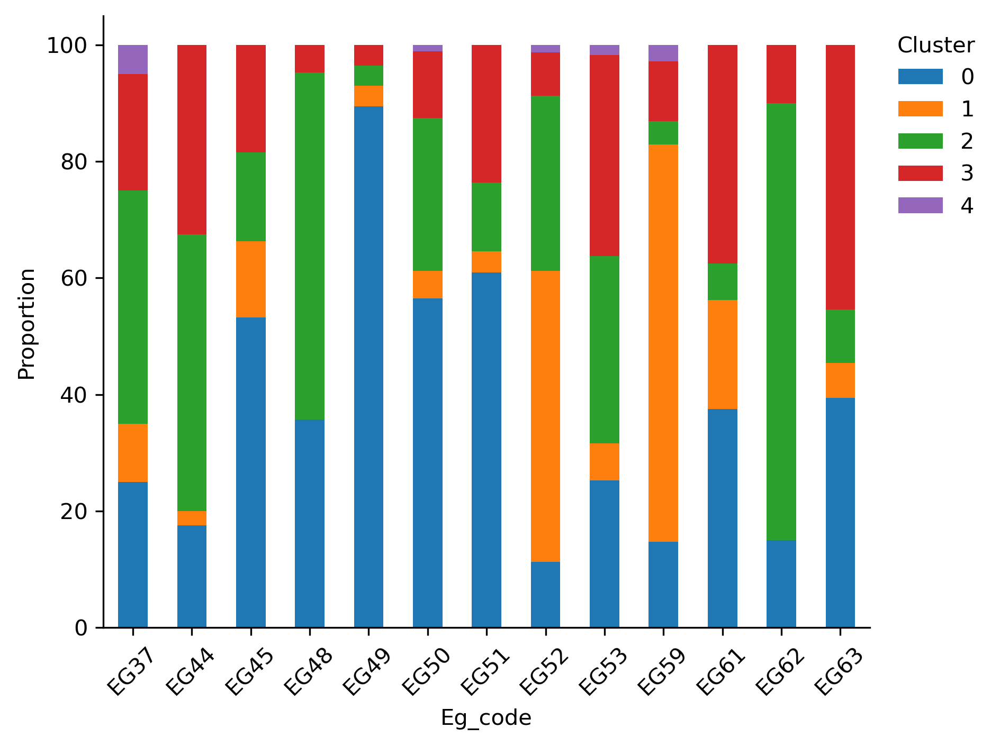

In [84]:
plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=45)


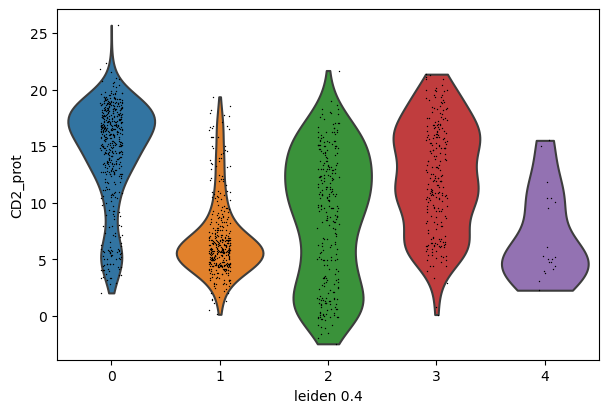

In [112]:
#CD2 for adaptive NK cells (Dufva)

sc.pl.violin(adata_nk, ['CD2_prot'], groupby='leiden_0.4')



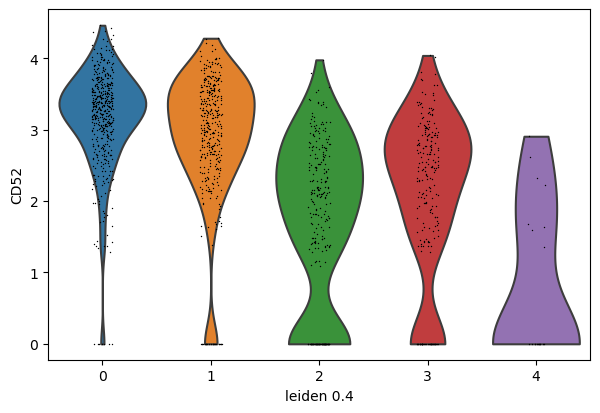

In [113]:
#CD52 for adaptive NK cells

sc.pl.violin(adata_nk, ['CD52'], groupby='leiden_0.4')

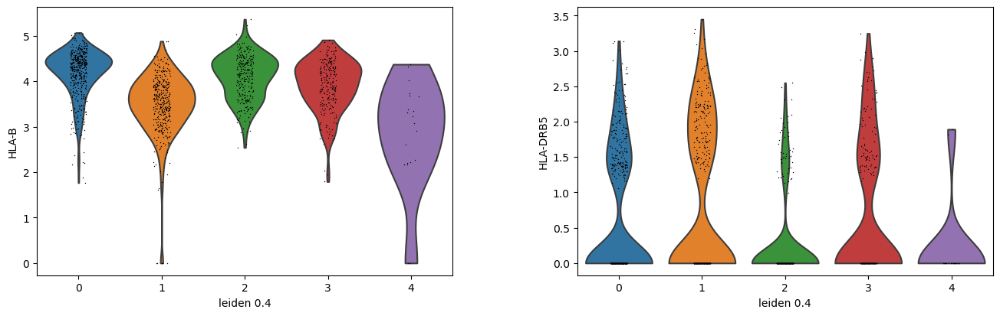

In [116]:
#CD52 for adaptive NK cells

sc.pl.violin(adata_nk, ['HLA-B', 'HLA-DRB5'], groupby='leiden_0.4')

## DC56bright markers by Melsen

In [121]:
#Melsen et al.

cd56bright_mels = ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']

cd56bright_mels_prot= ['CD56', 'CD62L', "CD2_prot", 'CD127', 'CD117'] 


listOfmarkers= cd56bright_mels
cd56bright_melsen = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        cd56bright_melsen.append(x)
        
    

SELL


RNA markers


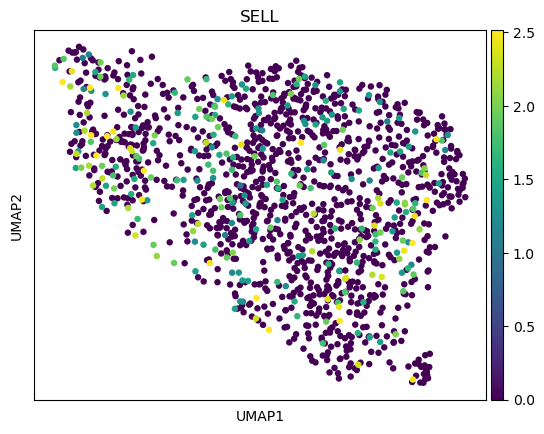

Protein markers


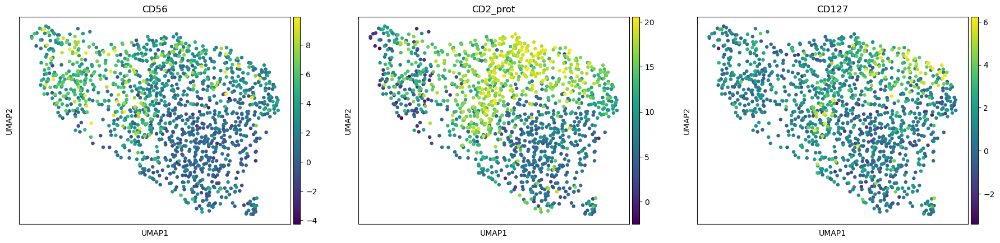

In [123]:
print("RNA markers")
sc.pl.umap(adata_nk, color=cd56bright_melsen, ncols = 3, vmax="p99")

print("Protein markers")
sc.pl.umap(adata_nk, color=cd56bright_mels_prot, vmax="p99")

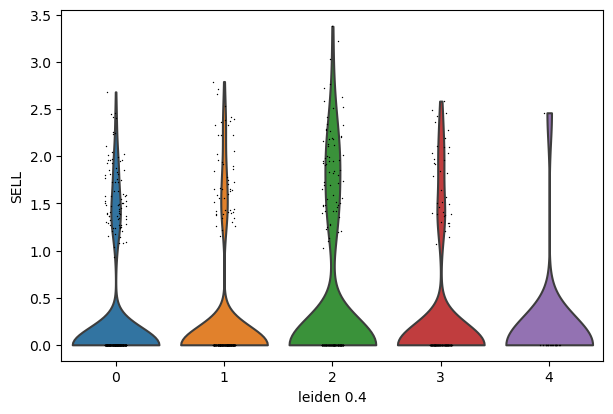

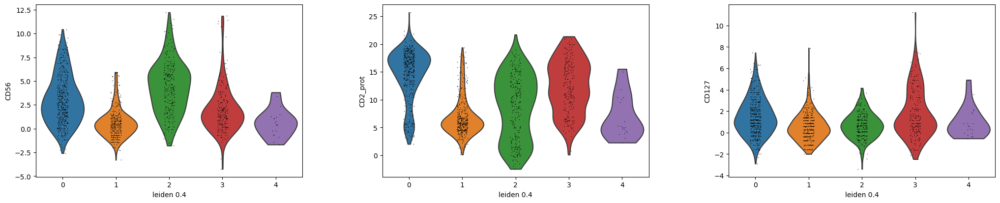

In [105]:
#CD56bright markers

sc.pl.violin(adata_nk, ['SELL'], groupby='leiden_0.4') #IL7R, GZMK not found

sc.pl.violin(adata_nk, ['CD56', 'CD2_prot', 'CD127'], groupby='leiden_0.4')

## Mature CD56dim by Melsen

In [124]:
#cluster 1

cd56dim_1= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1']

#cluster 7 (suggested to be intermediate stage between CD56bright and CD56dim NK cells)

cd56dim_7 = ['GZMK', 'SELL'] #higher expression compared to cluster 1
cd56dim_7_prot = ['CD62L']


In [125]:
listOfmarkers= cd56dim_1
cd56dim_1_melsen = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        cd56dim_1_melsen.append(x)
        

S100A4
S100A6
ACTB
ACTG1
CORO1A
PFN1


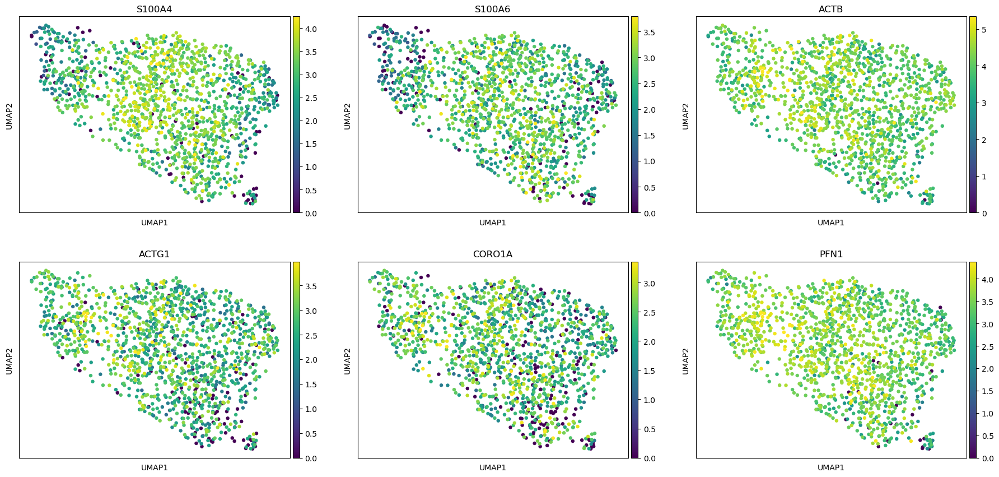

In [126]:
#Cluster 1 (more mature)
sc.pl.umap(adata_nk, color=cd56dim_1_melsen, ncols = 3, vmax="p99")


In [127]:
listOfmarkers= cd56dim_7
cd56dim_7_melsen = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        cd56dim_7_melsen.append(x)

SELL


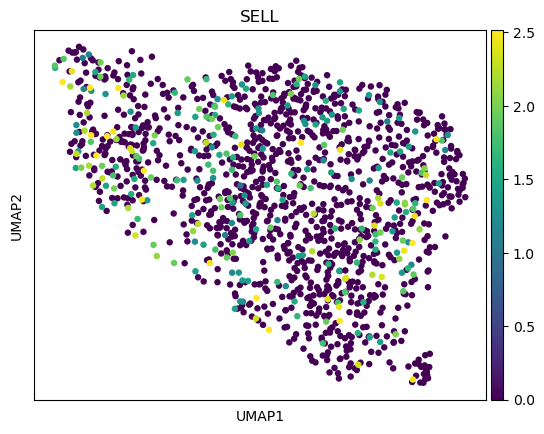

In [128]:
#Cluster 7 (transitional state)
sc.pl.umap(adata_nk, color=cd56dim_7_melsen, ncols = 3, vmax="p99")


## Tissue-resident NK by Melsen

In [146]:
tr_mels= ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']

listOfmarkers= tr_mels
tr_melsen = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        tr_melsen.append(x)

CCL4
DUSP2
CXCR4
BTG1


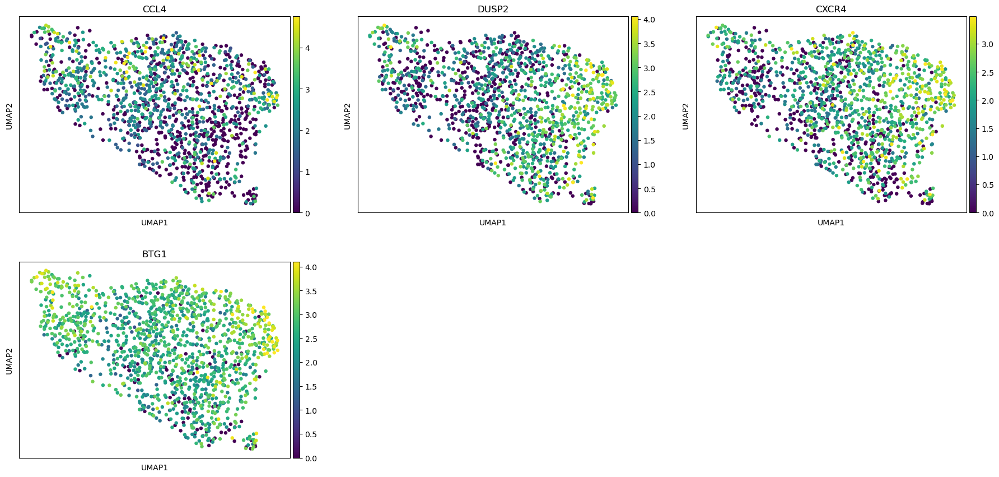

In [147]:
sc.pl.umap(adata_nk, color=tr_melsen, ncols = 3, vmax="p99")

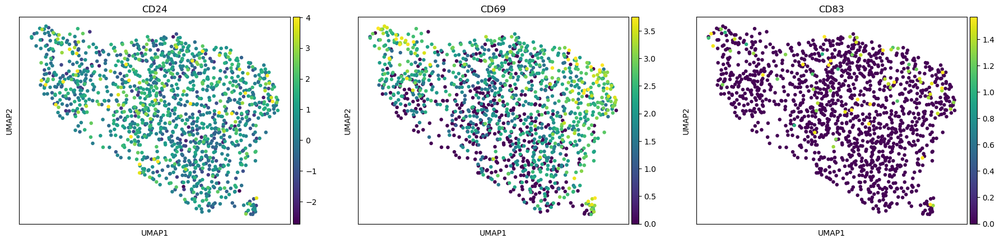

In [159]:
#tissue resident markers identified by regressors (were protein, these are RNA)

sc.pl.umap(adata_nk, color=['CD24', 'CD69', 'CD83'], ncols = 3, vmax="p99")

## Adaptive NK by Dufva

In [129]:
#Dufva et al. 

adaptive = ['LAG3', 'GZMH', 'KLRG1', 'KLRC3', 'HLA-DR', 'CD2', 'CD52', 'RHOB']


listOfmarkers= adaptive
markers_adaptive = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_adaptive.append(x)

KLRG1
CD52
RHOB


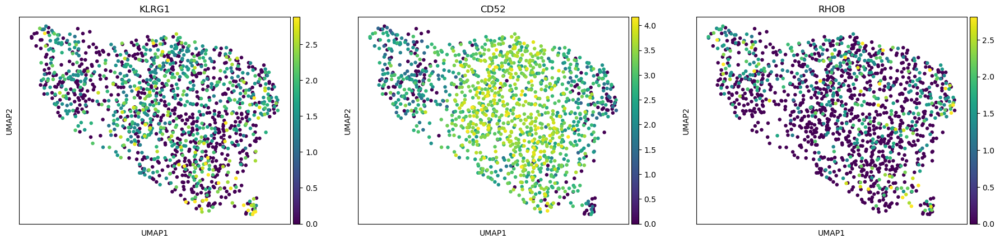

In [130]:
sc.pl.umap(adata_nk, color=markers_adaptive, ncols = 3, vmax="p99")

## Adaptive NK by Yang 

In [131]:
#Yang et al. 

adaptive2 = ['KLRC2', 'CD52', 'CD3E', 'CD3D', 'CD3G']

listOfmarkers= adaptive2
markers_adaptive_yang = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_adaptive_yang.append(x)

CD52


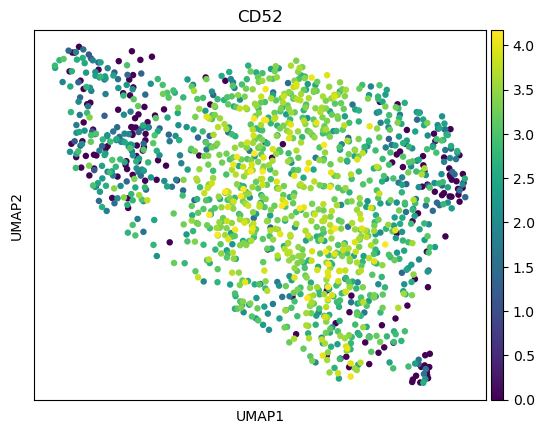

In [132]:
sc.pl.umap(adata_nk, color=markers_adaptive_yang, ncols = 3, vmax="p99")

## Activated NK by Yang

In [134]:
#Activated by Yang

activated = ['NFKBIA', 'JUN', 'JUNB', 'ZFP36', 'DOS', 'FOSB', 'DUSP1', 'NR4A2', 'CXCR4']


listOfmarkers= activated
markers_activated = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_activated.append(x)

NFKBIA
JUN
JUNB
ZFP36
FOSB
DUSP1
NR4A2
CXCR4


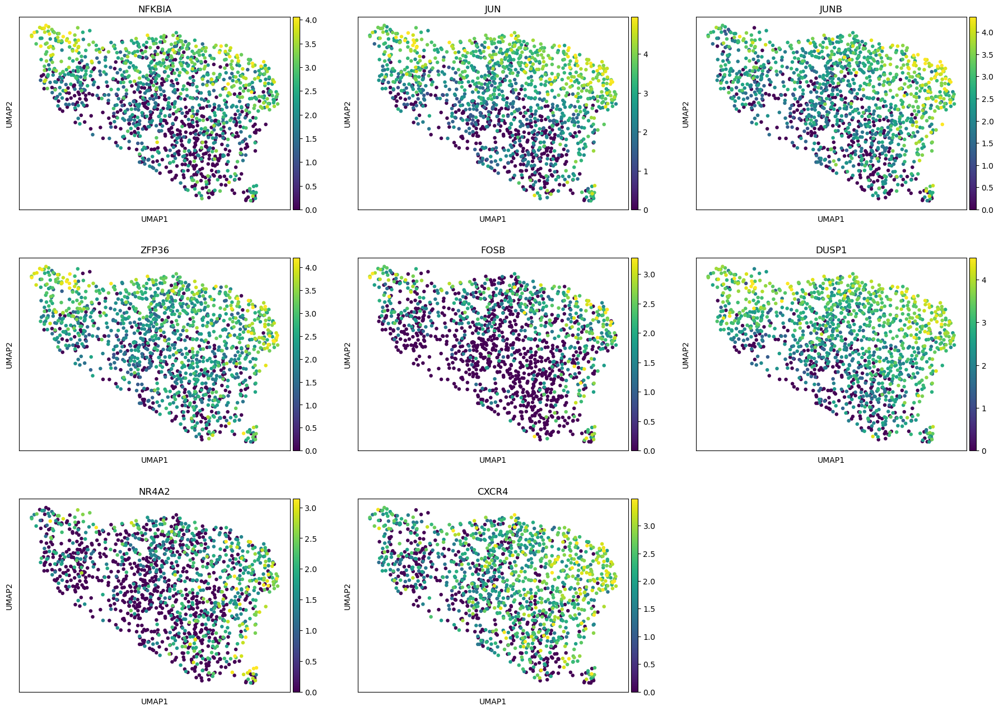

In [135]:
sc.pl.umap(adata_nk, color=markers_activated, ncols = 3, vmax="p99")

In [ ]:
sc.pl.violin(adata_nk, , groupby='leiden_0.4')

## Mature NK by Yang

In [138]:
#by Yang et al. 

mature = ['B3GAT1', 'PRF1', 'GZMA', 'GZMB', 'GZMH', 'ACTB', 'ARPC2', 'CORO1A', 'CFL1', 'CST7', 'PFN1', 'ANXA1']

listOfmarkers= mature
markers_mature = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_mature.append(x)

ACTB
ARPC2
CORO1A
CFL1
CST7
PFN1
ANXA1


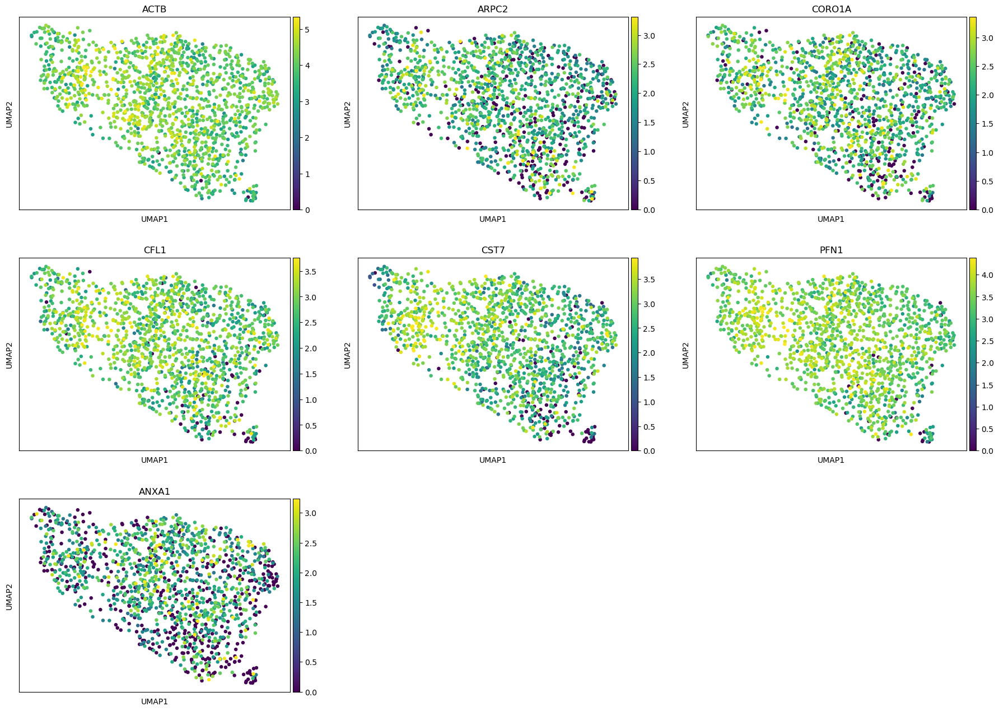

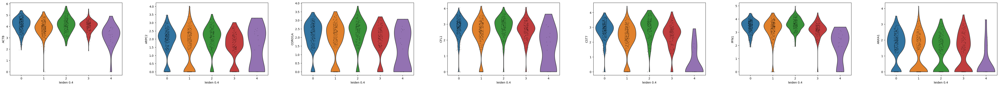

In [144]:
sc.pl.umap(adata_nk, color=markers_mature, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk, markers_mature, groupby='leiden_0.4')

## Terminal markers Yang et al.

In [141]:
#by Yang et al. 

terminal = ['ZEB2', 'CX3CR1', 'HAVCR2'] 

listOfmarkers= terminal
markers_terminal = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_terminal.append(x)

ZEB2


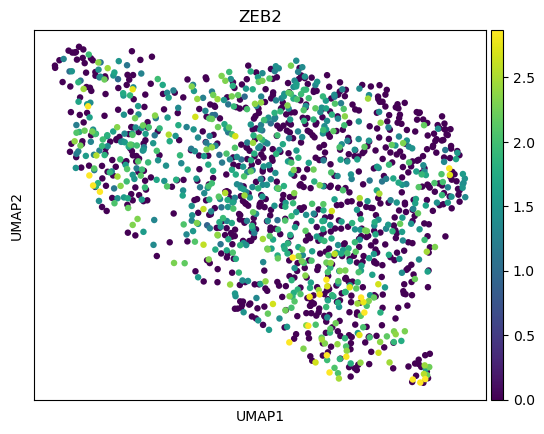

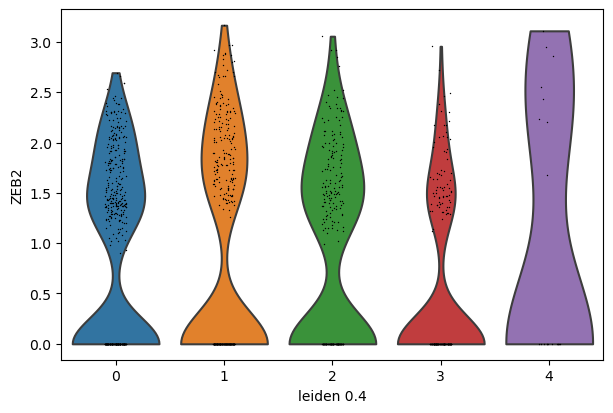

In [143]:
sc.pl.umap(adata_nk, color=markers_terminal, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk, markers_terminal, groupby='leiden_0.4')